# BUDT737 Big Data and Artifical Intelligence
## Group 17
### Natural Language Processing with Disaster Tweets
###Team: Alekya Ghanta, Vikash Gujju, Lohith Maddula, Jharna Dharaiya, Rahul Murugkar

# Load Data

In [1]:
import pandas as pd
df_train=pd.read_csv('train.csv')
df_test=pd.read_csv('test.csv')
df_test_pred = pd.read_csv('sample_submission.csv')

print(df_train.count())
print(df_test.count())

id          7613
keyword     7552
location    5080
text        7613
target      7613
dtype: int64
id          3263
keyword     3237
location    2158
text        3263
dtype: int64


In [2]:
# assign df_train to df and view size and sample
df = df_train.copy()
print(df.count())
print(df.head())

# assign df_test and view size and sample
print(df_test.count())
print(df_test.head())

id          7613
keyword     7552
location    5080
text        7613
target      7613
dtype: int64
   id keyword location                                               text  \
0   1     NaN      NaN  Our Deeds are the Reason of this #earthquake M...   
1   4     NaN      NaN             Forest fire near La Ronge Sask. Canada   
2   5     NaN      NaN  All residents asked to 'shelter in place' are ...   
3   6     NaN      NaN  13,000 people receive #wildfires evacuation or...   
4   7     NaN      NaN  Just got sent this photo from Ruby #Alaska as ...   

   target  
0       1  
1       1  
2       1  
3       1  
4       1  
id          3263
keyword     3237
location    2158
text        3263
dtype: int64
   id keyword location                                               text
0   0     NaN      NaN                 Just happened a terrible car crash
1   2     NaN      NaN  Heard about #earthquake is different cities, s...
2   3     NaN      NaN  there is a forest fire at spot pond, gee

## Data Pre-processing for EDA

In [3]:
#importing necessary libraries

import re
import nltk
import numpy as np 
import pandas as pd
import random
import os
import keras
import tensorflow as tf
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('words')
from nltk import word_tokenize
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import WordNetLemmatizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
import matplotlib.pyplot as plt

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


In [4]:
# splits (tokenize) the sentence into word list and coverts words to lower case,
# removes non english characters, emojis, urls & white space

def clean_text(text):
  text = word_tokenize(text)
  
  cleaned_text = ' '
  
  for word in text:
    word = re.sub('http://\S+|https://\S+|http+', '', word)
    word = word.lower()
    word = re.sub('[^a-z]','',word)
    cleaned_text += ' ' + word.strip()
  return cleaned_text

In [5]:
df['text'] = df['text'].apply(clean_text)
print(df.head())

df_test['text'] = df_test['text'].apply(clean_text)
print(df_test.head())

   id keyword location                                               text  \
0   1     NaN      NaN    our deeds are the reason of this  earthquake...   
1   4     NaN      NaN             forest fire near la ronge sask  canada   
2   5     NaN      NaN    all residents asked to shelter in place  are...   
3   6     NaN      NaN     people receive  wildfires evacuation orders...   
4   7     NaN      NaN    just got sent this photo from ruby  alaska a...   

   target  
0       1  
1       1  
2       1  
3       1  
4       1  
   id keyword location                                               text
0   0     NaN      NaN                 just happened a terrible car crash
1   2     NaN      NaN    heard about  earthquake is different cities ...
2   3     NaN      NaN    there is a forest fire at spot pond  geese a...
3   9     NaN      NaN           apocalypse lighting   spokane  wildfires
4  11     NaN      NaN        typhoon soudelor kills  in china and taiwan


In [6]:
# remove emojis - https://devpress.csdn.net/python/62fd0af07e66823466191415.html
def deEmojify(text):
    
    text = word_tokenize(text)
    cleaned_text=' '
    regrex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags = re.UNICODE)

    for word in text:
      word = regrex_pattern.sub(r'',word)
      cleaned_text += ' '+word.strip()

    return cleaned_text

In [7]:
df['text'] = df['text'].apply(deEmojify)
print(df.head())

df_test['text'] = df_test['text'].apply(deEmojify)
print(df_test.head())

   id keyword location                                               text  \
0   1     NaN      NaN    our deeds are the reason of this earthquake ...   
1   4     NaN      NaN              forest fire near la ronge sask canada   
2   5     NaN      NaN    all residents asked to shelter in place are ...   
3   6     NaN      NaN    people receive wildfires evacuation orders i...   
4   7     NaN      NaN    just got sent this photo from ruby alaska as...   

   target  
0       1  
1       1  
2       1  
3       1  
4       1  
   id keyword location                                               text
0   0     NaN      NaN                 just happened a terrible car crash
1   2     NaN      NaN    heard about earthquake is different cities s...
2   3     NaN      NaN    there is a forest fire at spot pond geese ar...
3   9     NaN      NaN              apocalypse lighting spokane wildfires
4  11     NaN      NaN         typhoon soudelor kills in china and taiwan


In [8]:
# splits (tokenize) the sentence into word list and 
# removes stop words from the sentence

def remove_stopwords(text):
  stopwords_list = stopwords.words('english')
  text = word_tokenize(text)
  
  cleaned_text=' '
  
  for word in text:
    if word in stopwords_list:
      cleaned_text += ''
    else:
      cleaned_text += ' '+ word
  
  return cleaned_text

In [9]:
df['text'] = df['text'].apply(remove_stopwords)
print(df.head())

df_test['text'] = df_test['text'].apply(remove_stopwords)
print(df_test.head())

   id keyword location                                               text  \
0   1     NaN      NaN       deeds reason earthquake may allah forgive us   
1   4     NaN      NaN              forest fire near la ronge sask canada   
2   5     NaN      NaN    residents asked shelter place notified offic...   
3   6     NaN      NaN    people receive wildfires evacuation orders c...   
4   7     NaN      NaN    got sent photo ruby alaska smoke wildfires p...   

   target  
0       1  
1       1  
2       1  
3       1  
4       1  
   id keyword location                                               text
0   0     NaN      NaN                        happened terrible car crash
1   2     NaN      NaN    heard earthquake different cities stay safe ...
2   3     NaN      NaN    forest fire spot pond geese fleeing across s...
3   9     NaN      NaN              apocalypse lighting spokane wildfires
4  11     NaN      NaN                typhoon soudelor kills china taiwan


In [10]:
# splits (tokenize) the sentence into word list and 
# lemmatizing is performed on the words using WordNetLemmatizer

def lemmatizing(text):
  lemmatizer = WordNetLemmatizer()
  text = word_tokenize(text)
  
  lemma_text=' '
  
  for word in text:
    word = lemmatizer.lemmatize(word)
    lemma_text += ' '+ word

  return lemma_text

In [11]:
df['text'] = df['text'].apply(lemmatizing)
print(df.head())

df_test['text'] = df_test['text'].apply(lemmatizing)
print(df_test.head())

   id keyword location                                               text  \
0   1     NaN      NaN         deed reason earthquake may allah forgive u   
1   4     NaN      NaN              forest fire near la ronge sask canada   
2   5     NaN      NaN    resident asked shelter place notified office...   
3   6     NaN      NaN    people receive wildfire evacuation order cal...   
4   7     NaN      NaN    got sent photo ruby alaska smoke wildfire po...   

   target  
0       1  
1       1  
2       1  
3       1  
4       1  
   id keyword location                                               text
0   0     NaN      NaN                        happened terrible car crash
1   2     NaN      NaN    heard earthquake different city stay safe ev...
2   3     NaN      NaN    forest fire spot pond goose fleeing across s...
3   9     NaN      NaN               apocalypse lighting spokane wildfire
4  11     NaN      NaN                 typhoon soudelor kill china taiwan


In [12]:
# splits (tokenize) the sentence into word list and 
# stemming is performed on the words using SnowballStemmer (Porter2)

def stemming(text):
  stemmer = SnowballStemmer("english")
  text = word_tokenize(text)
  
  stemmed_text=' '
  
  for word in text:
    word = stemmer.stem(word)
    stemmed_text += ' '+ word

  return stemmed_text


In [13]:
df['text'] = df['text'].apply(stemming)
print(df.head())

df_test['text'] = df_test['text'].apply(stemming)
print(df_test.head())

   id keyword location                                               text  \
0   1     NaN      NaN           deed reason earthquak may allah forgiv u   
1   4     NaN      NaN               forest fire near la rong sask canada   
2   5     NaN      NaN    resid ask shelter place notifi offic evacu s...   
3   6     NaN      NaN        peopl receiv wildfir evacu order california   
4   7     NaN      NaN    got sent photo rubi alaska smoke wildfir pou...   

   target  
0       1  
1       1  
2       1  
3       1  
4       1  
   id keyword location                                               text
0   0     NaN      NaN                           happen terribl car crash
1   2     NaN      NaN      heard earthquak differ citi stay safe everyon
2   3     NaN      NaN    forest fire spot pond goos flee across stree...
3   9     NaN      NaN                     apocalyps light spokan wildfir
4  11     NaN      NaN                 typhoon soudelor kill china taiwan


In [14]:
# conevrting the data into a document term matrix using CountVectorizer
# https://www.geeksforgeeks.org/using-countvectorizer-to-extracting-features-from-text/

from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(stop_words='english')

# encode the document
vect = vectorizer.fit(df['text'])
vector = vect.transform(df['text'])

print("Vocabulary: ", vectorizer.vocabulary_) 
 
# document term matrix shape
print(vector.shape)

Vocabulary:  {'deed': 2927, 'reason': 9494, 'earthquak': 3501, 'allah': 314, 'forgiv': 4313, 'forest': 4306, 'near': 7904, 'la': 6480, 'rong': 9901, 'sask': 10142, 'canada': 1736, 'resid': 9674, 'ask': 660, 'shelter': 10446, 'place': 8893, 'notifi': 8143, 'offic': 8276, 'evacu': 3839, 'order': 8438, 'expect': 3899, 'peopl': 8736, 'receiv': 9510, 'wildfir': 17478, 'california': 1702, 'got': 4772, 'sent': 10331, 'photo': 8814, 'rubi': 9975, 'alaska': 268, 'smoke': 10720, 'pour': 9038, 'school': 10206, 'rockyfir': 9861, 'updat': 16946, 'hwi': 5483, 'close': 2196, 'direct': 3136, 'lake': 6500, 'counti': 2524, 'cafir': 1678, 'flood': 4232, 'disast': 3151, 'heavi': 5147, 'rain': 9387, 'caus': 1868, 'flash': 4201, 'street': 11158, 'manitou': 7086, 'colorado': 2308, 'spring': 10966, 'area': 567, 'hill': 5247, 'wood': 17578, 'emerg': 3649, 'happen': 5032, 'build': 1582, 'afraid': 167, 'tornado': 16515, 'come': 2325, 'die': 3108, 'heat': 5143, 'wave': 17316, 'far': 4015, 'haha': 4964, 'south': 1

In [15]:
#Building term document matrix & viewing 15 rows for first 5 tweets
# https://okan.cloud/posts/2021-04-08-text-vectorization-using-python-term-document-matrix/

term_doc = pd.DataFrame(vector.todense()).iloc[:5]  
term_doc.columns = vectorizer.get_feature_names_out()
term_document_matrix = term_doc.T
term_document_matrix.columns = ['Tweet:'+str(x) for x in range(1, 6)]
term_document_matrix['total_count'] = term_document_matrix.sum(axis=1)

# Top 25 words 
term_document_matrix = term_document_matrix.sort_values(by ='total_count',ascending=False)[:25] 

# Print the first 15 rows 
print(term_document_matrix.drop(columns=['total_count']).head(15))

         Tweet:1  Tweet:2  Tweet:3  Tweet:4  Tweet:5
wildfir        0        0        0        1        1
shelter        0        0        2        0        0
place          0        0        2        0        0
order          0        0        1        1        0
evacu          0        0        1        1        0
offic          0        0        1        0        0
reason         1        0        0        0        0
deed           1        0        0        0        0
school         0        0        0        0        1
notifi         0        0        1        0        0
rong           0        1        0        0        0
sent           0        0        0        0        1
canada         0        1        0        0        0
got            0        0        0        0        1
rubi           0        0        0        0        1


## EDA

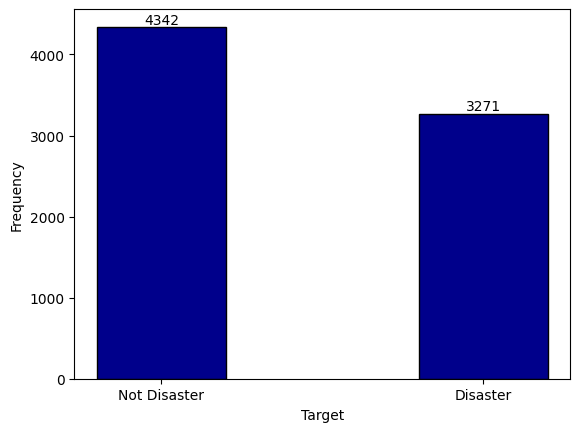

In [16]:
# Checking for Class Imbalance -  https://www.tutorialspoint.com/how-to-annotate-bars-in-bar-plot-with-matplotlib-in-python

#Counting tweets by Target Variable
df_train_target = df['target'].value_counts()

bars = plt.bar(df_train_target.index, df_train_target.values, color='darkblue',width=0.4,edgecolor = "black")  
plt.xticks([0, 1], ['Not Disaster', 'Disaster'])
plt.xlabel('Target')
plt.ylabel('Frequency')

# Annotating the bars 
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, yval, ha='center', va='bottom')

plt.show()


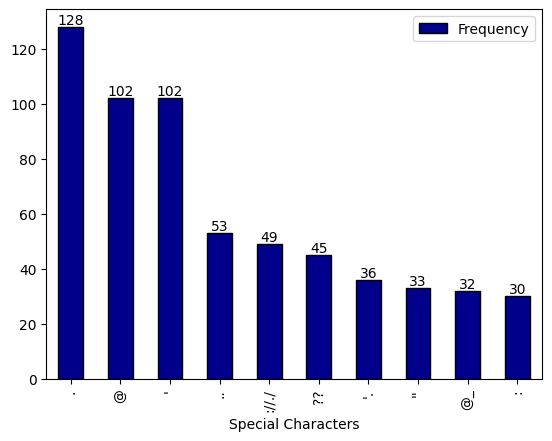

In [37]:
# Checking for special and non-alphabetic characters
import matplotlib.pyplot as plt

# Check for most freqent special characters
df_train['nonchars'] = [re.sub('[a-zA-Z\s]', '', x) for x in df_train.text.values]
freq_sc = df_train.nonchars.value_counts()[1:].reset_index()[0:10].rename(
    columns={'index': 'Special Characters', 'nonchars': 'Frequency'}).set_index(
        'Special Characters')
ax = freq_sc.plot(kind='bar', color='darkblue', edgecolor = "black")
ax1 = ax.bar_label(ax.containers[0], labels=freq_sc['Frequency'])

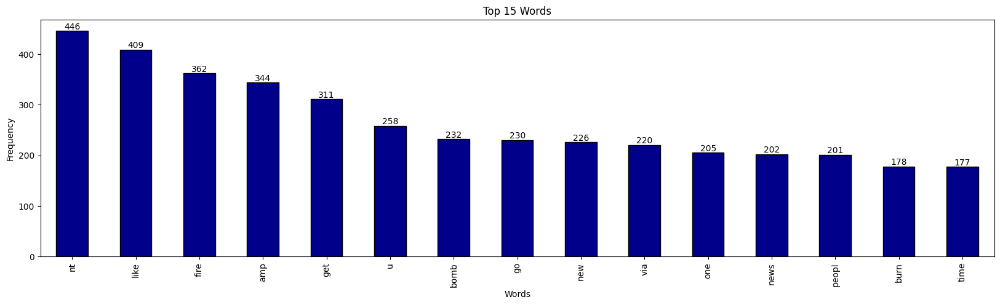

In [17]:
#Top 15 words most occured in the tweets- https://ashleygingeleski.com/tag/matplotlib/

# Extracting all words from text
words = []
for text in df['text']:
      words += [word for word in text.split()]
# Counting the occurrence of words
word_freq = pd.Series(words).value_counts()

plt.figure(figsize=(20, 5))
ax = word_freq[:15].plot(kind='bar', color="darkblue",edgecolor = "black")
plt.title('Top 15 Words')
plt.xlabel('Words')
plt.ylabel('Frequency')

# Annotating text for each bar
for i, v in enumerate(word_freq[:15]):
    ax.text(i, v, str(v), ha='center', va='bottom')

plt.show()

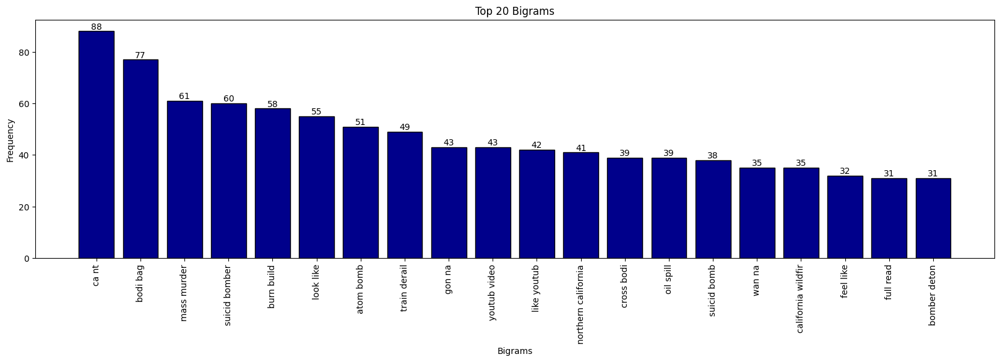

In [18]:
#N-grams Analysis - Bigram - https://stackoverflow.com/questions/13423919/computing-n-grams-using-python

#Defining n
n = 2

#Extracting n word pairs
def ngrams(text, n):
    words = [word for word in text.split()]
    ngrams = []
    for i in range(len(words)-n+1):
        ngram = ' '.join(words[i:i+n])
        ngrams.append(ngram)
    return ngrams

ngrams = df['text'].apply(lambda x: ngrams(x, n))

#Counting frequency
ngram_counts = {}

for ngram_set in ngrams:
    for ngram in ngram_set:
        if ngram in ngram_counts:
            ngram_counts[ngram] += 1
        else:
            ngram_counts[ngram] = 1

# Sorting the n-grams & filtering top 20 values
top_ngrams = dict(sorted(ngram_counts.items(), key=lambda x: x[1], reverse=True)[:20])

ngrams = list(top_ngrams.keys())
counts = list(top_ngrams.values())

plt.figure(figsize=(20, 5))
plt.bar(ngrams, counts, color = 'darkblue',edgecolor = "black")

# Annotating text for each bar
for i, count in enumerate(counts):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.xlabel('Bigrams')
plt.ylabel('Frequency')
plt.title('Top 20 Bigrams')
plt.xticks(rotation=90)
plt.show()


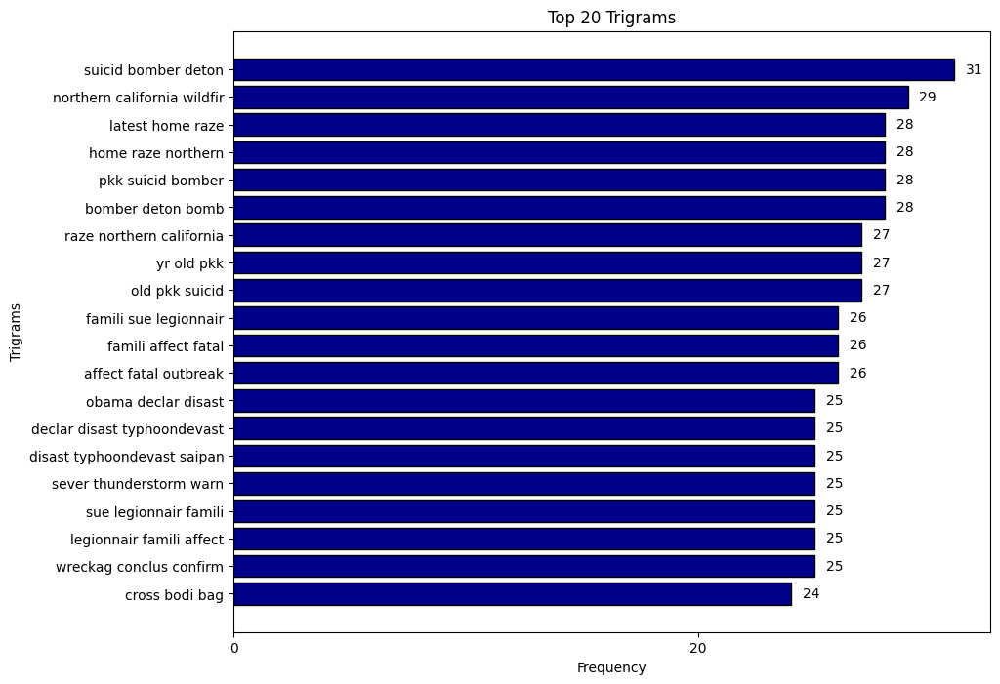

In [19]:
#N-grams Analysis - Bigram - https://stackoverflow.com/questions/13423919/computing-n-grams-using-python, 
#https://stackoverflow.com/questions/2051744/how-to-invert-the-x-or-y-axis

#Defining n
n = 3

#Extracting n word pairs
def ngrams(text, n):
    words = [word for word in text.split() if word.lower() not in ['via', 'like', 'got']]
    ngrams = []
    for i in range(len(words)-n+1):
        ngram = ' '.join(words[i:i+n])
        ngrams.append(ngram)
    return ngrams

ngrams = df['text'].apply(lambda x: ngrams(x, n))

#Counting frequency
ngram_counts = {}

for ngram_set in ngrams:
    for ngram in ngram_set:
        if ngram in ngram_counts:
            ngram_counts[ngram] += 1
        else:
            ngram_counts[ngram] = 1

# Sorting the n-grams & filtering top 20 values
top_ngrams = dict(sorted(ngram_counts.items(), key=lambda x: x[1], reverse=True)[:20])

# Extract keys and values from the dictionary
ngrams = list(top_ngrams.keys())
counts = list(top_ngrams.values())


plt.figure(figsize=(10, 8))
plt.barh(ngrams, counts, color='darkblue', edgecolor="black")

for i, count in enumerate(counts):
    plt.text(count+0.5, i, str(count), ha='left', va='center')

plt.xlabel('Frequency')
plt.ylabel('Trigrams')
plt.title('Top 20 Trigrams')
plt.gca().invert_yaxis()
plt.xticks(range(0, max(counts)+1, 20))
plt.show()


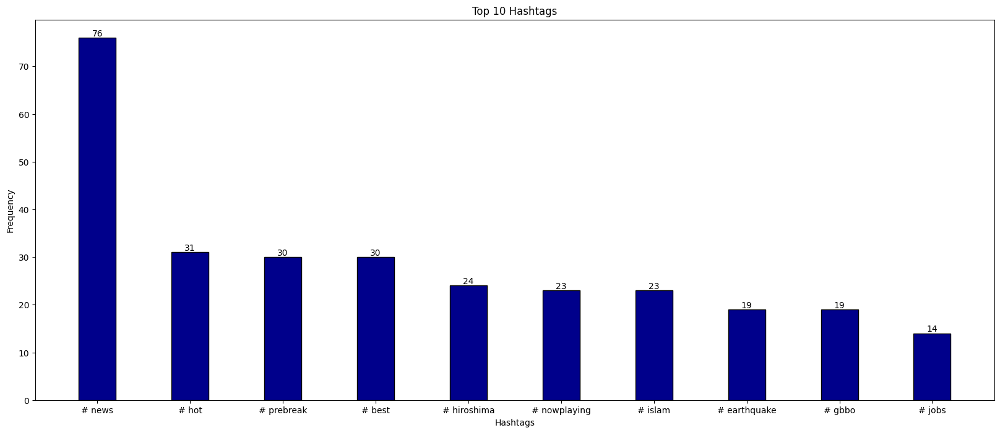

In [20]:
# Frequency of Hashtags - https://www.geeksforgeeks.org/python-extract-hashtags-from-text/
import string

#importing dataset again to add back #'s previously removed
df_hash_mention = pd.read_csv('train.csv')

def clean_text_hash_mention(text):
    text = word_tokenize(text)
    cleaned_text = ''
  
    for word in text:
        word = re.sub('http://\S+|https://\S+|http+', '', word)
        word = re.sub('[^a-z#@]', '', word.lower())
        cleaned_text += ' ' + word.strip()
    return cleaned_text

df_hash_mention['text'] = df_hash_mention['text'].apply(clean_text_hash_mention)
hashtags = {}

#Finding all Hashtags & Counting Frequency
for text in df_hash_mention['text']:
    matches = re.findall(r'\# \w+', text)
    for match in matches:
        if match in hashtags:
            hashtags[match] += 1
        else:
            hashtags[match] = 1

#Sorting the Hashtags & Plotting Graph
top_hashtags = sorted(hashtags.items(), key=lambda x: x[1], reverse=True)[:10]
x = [hashtag[0] for hashtag in top_hashtags]
y = [hashtag[1] for hashtag in top_hashtags]

plt.figure(figsize=(20, 8))
plt.bar(x, y, color = 'darkblue',edgecolor = "black", width=0.4)
for i, count in enumerate(y):
    plt.text(i, count, str(count), ha='center', va='bottom')
plt.xlabel('Hashtags')
plt.ylabel('Frequency')
plt.title('Top 10 Hashtags')
plt.show()


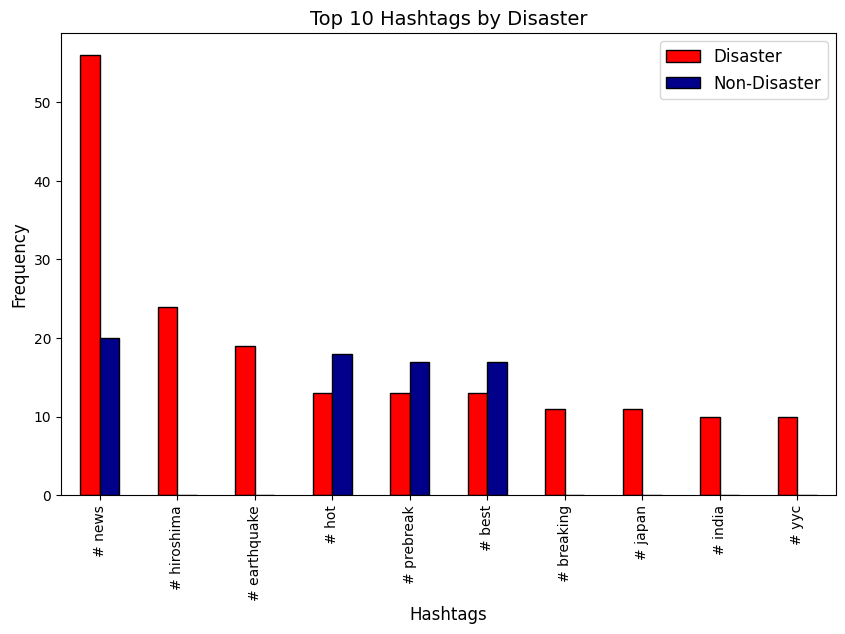

In [39]:
#Hashtags By Target Variable

#Finding all Hashtags
def extract_hashtags(text):
    hashtags = re.findall(r'\# \w+', text)
    return hashtags

df_hash_mention['hashtags'] = df_hash_mention['text'].apply(extract_hashtags)


#Counting Frequency By target variable
hashtag_freq_by_target = {}

for i, row in df_hash_mention.iterrows():
    target = row['target']
    hashtags = row['hashtags']

    for hashtag in hashtags:
        if hashtag in hashtag_freq_by_target:
            hashtag_freq_by_target[hashtag][target] += 1
        else:
            hashtag_freq_by_target[hashtag] = {0: 0, 1: 0}
            hashtag_freq_by_target[hashtag][target] += 1


#Sorting the frequencies
hashtag_freq_df = pd.DataFrame.from_dict(hashtag_freq_by_target, orient='index')
hashtag_freq_df.index.name = 'hashtag'
hashtag_freq_df = hashtag_freq_df.nlargest(10, 1)


#Plotting the graph
hashtag_freq_df[[1, 0]].plot(kind='bar', rot=0, figsize=(10, 6),color=['red',
                                                               'darkblue'],
                     edgecolor = "black")
plt.title('Top 10 Hashtags by Disaster', fontsize=14)
plt.xlabel('Hashtags', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xticks(fontsize=10, rotation=90)
plt.legend(['Disaster','Non-Disaster'], fontsize=12)
plt.show()

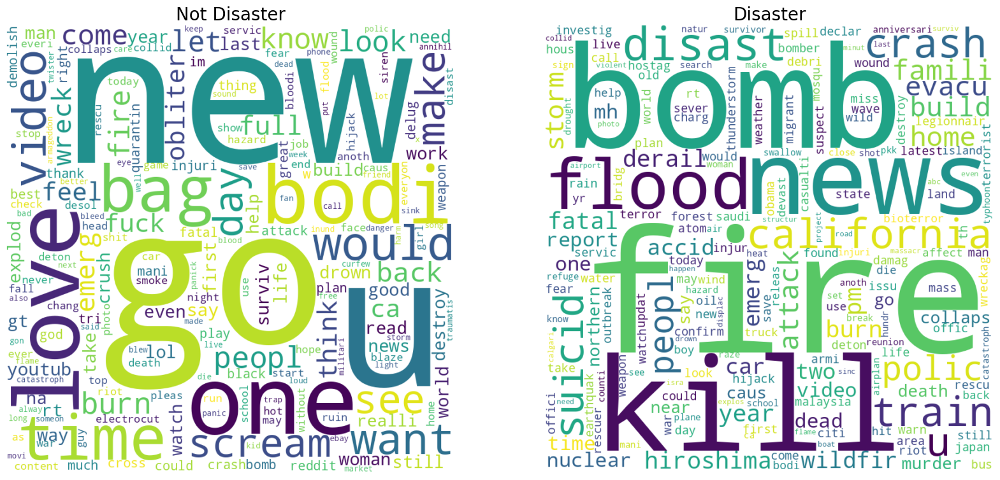

In [22]:
#Word Cloud by Target Variable Type - https://www.python-graph-gallery.com/261-custom-python-wordcloud

from wordcloud import WordCloud
word_freq_by_target = {0: {}, 1: {}}

#Counting frequency by of words by Target variablesh
for i, row in  df.iterrows():
    target = row['target']
    text = row['text']
    words = text.split()
    for word in words:
       if word.lower() not in ['via', 'like', 'got','get','nt','amp']:
            if word in word_freq_by_target[target]:
                word_freq_by_target[target][word] += 1
            else:
                word_freq_by_target[target][word] = 1

#Constructing WordCloud for Non-Disaster Tweeets
wordcloud0 = WordCloud(width = 800, height = 800, 
                background_color ='white', stopwords = stopwords.words('english'),
                min_font_size = 10).generate_from_frequencies(word_freq_by_target[0])

#Constructing WordCloud for Disaster Tweeets
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white', stopwords = stopwords.words('english'),
                min_font_size = 10).generate_from_frequencies(word_freq_by_target[1])


#Displaying the generated image
fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(20,10))
ax0.imshow(wordcloud0, interpolation='bilinear')
ax0.axis('off')
ax0.set_title('Not Disaster', fontsize=20)
ax1.imshow(wordcloud1, interpolation='bilinear')
ax1.axis('off')
ax1.set_title('Disaster', fontsize=20)
plt.show()


## Model Building



###Data Preprocessing for Model

In [23]:
#Importing the train, test data again
#Splitting (tokenize) the sentence into word list and coverting words to lower case, removing non english characters, emojis, urls, white space & stop words
df_train_model=pd.read_csv('train.csv')
df_test_model=pd.read_csv('test.csv')

df_train_model['text'] = df_train_model['text'].apply(clean_text)
df_test_model['text'] = df_test_model['text'].apply(clean_text)

df_train_model['text'] = df_train_model['text'].apply(deEmojify)
df_test_model['text'] = df_test_model['text'].apply(deEmojify)

df_train_model['text'] = df_train_model['text'].apply(remove_stopwords)
df_test_model['text'] = df_test_model['text'].apply(remove_stopwords)

In [24]:
#Checking the cleaned dataframe

train_df = df_train_model[["text","target"]]
train_df.head()

,text,target
0,deeds reason earthquake may allah forgive us,1
1,forest fire near la ronge sask canada,1
2,residents asked shelter place notified offic...,1
3,people receive wildfires evacuation orders c...,1
4,got sent photo ruby alaska smoke wildfires p...,1


In [25]:
#Storing the text values to tokenize & do padding

df_train_text = train_df.text.values
df_train_labels = train_df.target.values
df_test_text = df_test_model.text.values

### Model

In [26]:
#Hyperparameters

#Tokenizing the text & Padding sequences
words_in_voc = 15000
out_of_vocab = "<UNK>"
max_len = 135
padding_position = 'post'
emb_dim = 128
epochs = 25
batch = 32
seed = 42

def fit_tokenizer(train_texts, num_words, oov_token):
    tokenizer = Tokenizer(num_words=words_in_voc, oov_token=out_of_vocab)
    tokenizer.fit_on_texts(train_texts)
    return tokenizer

tokenizer = fit_tokenizer(df_train_text,words_in_voc,out_of_vocab)
word_index = tokenizer.word_index

def seq_and_pad(texts, tokenizer, padding, maxlen):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=maxlen, padding=padding_position)
    return padded_sequences

train_padded_seq = seq_and_pad(df_train_text, tokenizer, padding_position, max_len)
df_test_padded_seq = seq_and_pad(df_test_text, tokenizer, padding_position, max_len)

In [27]:
#Model to loop with different learning rates and dropout rates in search of best hyperparameters
import tensorflow as tf
import numpy as np

stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20)

learning_rates =np.arange(0.0001, 0.01, 0.0009)
dropout_rates = np.arange(0.2,0.5,0.1)

keras_accuracy =[]

for lr in learning_rates:
  for dr in dropout_rates:
#Model Architecture
    def create_model(num_words, embedding_dim, maxlen):
        random.seed(seed)
        np.random.seed(seed)
        tf.keras.utils.set_random_seed(seed)
        model = tf.keras.Sequential([
            tf.keras.layers.Embedding(num_words, embedding_dim, input_length=maxlen),
            tf.keras.layers.GlobalAveragePooling1D(),
            tf.keras.layers.Dense(256, activation='softmax'),
            tf.keras.layers.Dropout(dr),
            tf.keras.layers.Dense(128, activation='softmax'),
            tf.keras.layers.Dropout(dr),
            tf.keras.layers.Dense(1, activation='sigmoid')])
        opt = keras.optimizers.Adam(learning_rate=lr)
        model.compile(optimizer=opt,
                    loss='binary_crossentropy',
                    metrics=['accuracy'])
        return model

#Building model based on the Hyperparameters
    model = create_model(words_in_voc, emb_dim, max_len)

#Fitting the model on training data
    results = model.fit(train_padded_seq, df_train_labels, epochs=epochs,
                    batch_size=batch, validation_split=0.2,
                    callbacks=[stop_early])
    keras_accuracy.append([lr,dr,results.history['val_accuracy'][-1]])
print(keras_accuracy)

Epoch 1/25
191/191 [==============================] - 5s 6ms/step - loss: 0.6928 - accuracy: 0.5253 - val_loss: 0.6926 - val_accuracy: 0.5345
Epoch 2/25
191/191 [==============================] - 1s 7ms/step - loss: 0.6908 - accuracy: 0.5793 - val_loss: 0.6919 - val_accuracy: 0.5345
Epoch 3/25
191/191 [==============================] - 1s 7ms/step - loss: 0.6892 - accuracy: 0.5793 - val_loss: 0.6914 - val_accuracy: 0.5345
Epoch 4/25
191/191 [==============================] - 1s 5ms/step - loss: 0.6879 - accuracy: 0.5793 - val_loss: 0.6911 - val_accuracy: 0.5345
Epoch 5/25
191/191 [==============================] - 1s 5ms/step - loss: 0.6866 - accuracy: 0.5793 - val_loss: 0.6909 - val_accuracy: 0.5345
Epoch 6/25
191/191 [==============================] - 1s 5ms/step - loss: 0.6856 - accuracy: 0.5793 - val_loss: 0.6908 - val_accuracy: 0.5345
Epoch 7/25
191/191 [==============================] - 1s 5ms/step - loss: 0.6847 - accuracy: 0.5793 - val_loss: 0.6908 - val_accuracy: 0.5345
Epoch 

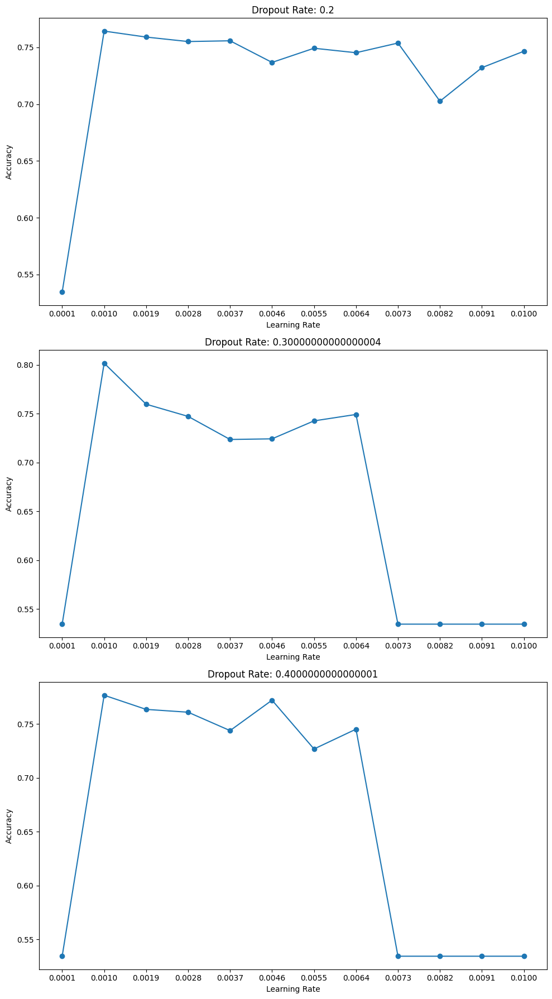

In [28]:
# Separate the learning rates, dropout rates, and accuracies into different lists
learning_rates_list = []
dropout_rates_list = []
accuracies_dict = {}

for lr, dr, acc in keras_accuracy:
    learning_rates_list.append(lr)
    dropout_rates_list.append(dr)

    if dr not in accuracies_dict:
        accuracies_dict[dr] = []
    accuracies_dict[dr].append(acc)
learning_rates_list= np.unique(learning_rates_list)
# Create subplots based on dropout rates
dropout_rates_unique = np.unique(dropout_rates_list)
num_subplots = len(dropout_rates_unique)
fig, axs = plt.subplots(num_subplots, 1, figsize=(10, 6 * num_subplots))

# Iterate over each subplot and plot the data
for i, dropout_rate in enumerate(dropout_rates_unique):
    ax = axs[i]
    ax.set_title(f"Dropout Rate: {dropout_rate}")
    ax.plot(learning_rates_list, accuracies_dict[dropout_rate], marker='o')
    ax.set_xlabel("Learning Rate")
    ax.set_ylabel("Accuracy")
    ax.grid(False)
    ax.set_xticks(learning_rates_list)
plt.tight_layout()
plt.show()

In [29]:
# Get the maximum accuracy from the list
max_accuracy = max(keras_accuracy, key=lambda x: x[2])
max_accuracy

[0.001, 0.30000000000000004, 0.8017071485519409]

In [30]:
#Model based on the best hyperparameter tuned values

stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20)


# Load the Tensorboard notebook extension
# And import datetime

%load_ext tensorboard
tfboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs")

lr=max_accuracy[0]
dr =max_accuracy[1]
#Model Architecture
def create_model(num_words, embedding_dim, maxlen):
    random.seed(seed)
    np.random.seed(seed)
    tf.keras.utils.set_random_seed(seed)
    model = tf.keras.Sequential([
        tf.keras.layers.Embedding(num_words, embedding_dim, input_length=maxlen),
        tf.keras.layers.GlobalAveragePooling1D(),
        tf.keras.layers.Dense(256, activation='softmax'),
        tf.keras.layers.Dropout(dr),
        tf.keras.layers.Dense(128, activation='softmax'),
        tf.keras.layers.Dropout(dr),
        tf.keras.layers.Dense(1, activation='sigmoid')])
    
    opt = keras.optimizers.Adam(learning_rate=lr)
    model.compile(optimizer=opt,
                    loss='binary_crossentropy',
                    metrics=['accuracy'])
    return model

#Building model based on the Hyperparameters
model = create_model(words_in_voc, emb_dim, max_len)

#Fitting the model on training data
history = model.fit(train_padded_seq, df_train_labels, epochs=epochs,
                    batch_size=batch, validation_split=0.2,
                    callbacks=[stop_early,tfboard_callback])

Epoch 1/25
191/191 [==============================] - 2s 6ms/step - loss: 0.6864 - accuracy: 0.5759 - val_loss: 0.6912 - val_accuracy: 0.5345
Epoch 2/25
191/191 [==============================] - 1s 6ms/step - loss: 0.6814 - accuracy: 0.5793 - val_loss: 0.6930 - val_accuracy: 0.5345
Epoch 3/25
191/191 [==============================] - 1s 6ms/step - loss: 0.6807 - accuracy: 0.5793 - val_loss: 0.6940 - val_accuracy: 0.5345
Epoch 4/25
191/191 [==============================] - 1s 6ms/step - loss: 0.6808 - accuracy: 0.5793 - val_loss: 0.6947 - val_accuracy: 0.5345
Epoch 5/25
191/191 [==============================] - 1s 5ms/step - loss: 0.6808 - accuracy: 0.5793 - val_loss: 0.6947 - val_accuracy: 0.5345
Epoch 6/25
191/191 [==============================] - 1s 5ms/step - loss: 0.6805 - accuracy: 0.5793 - val_loss: 0.6948 - val_accuracy: 0.5345
Epoch 7/25
191/191 [==============================] - 1s 5ms/step - loss: 0.6806 - accuracy: 0.5793 - val_loss: 0.6950 - val_accuracy: 0.5345
Epoch 

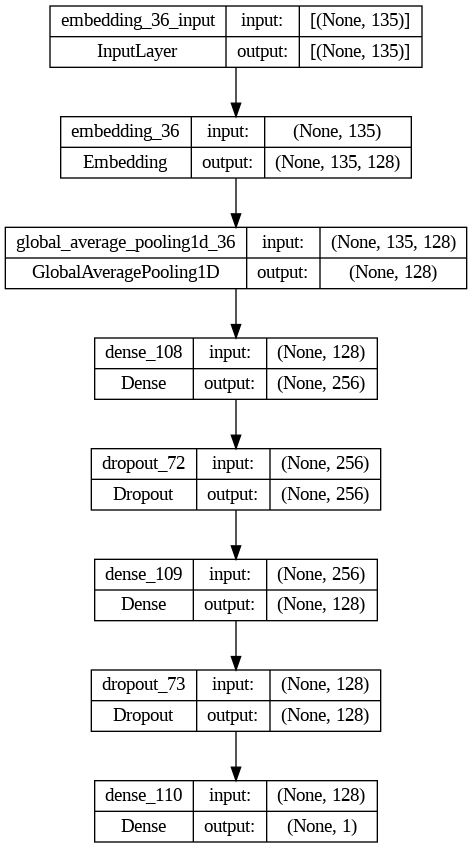

In [31]:
#Model Structure
import keras
keras.utils.plot_model(model, to_file='model.png', show_shapes=True)

##Model Performance & Results

In [32]:
# Load the Tensorboard notebook extension
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

238/238 [==============================] - 0s 2ms/step
[[4090  252]
 [ 485 2786]]


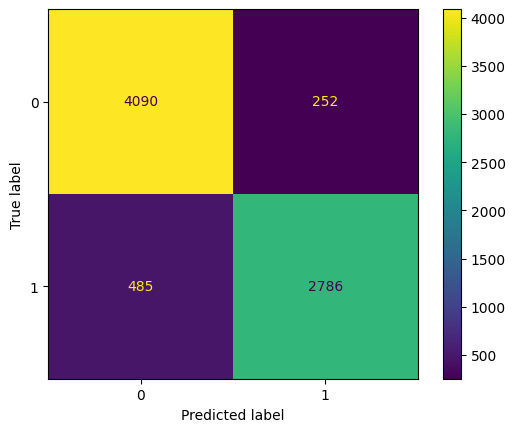

In [33]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

df_train_predictions = model.predict(train_padded_seq).round().astype(int)

conf_mat= confusion_matrix(df_train_labels,df_train_predictions)
print(conf_mat)
ConfusionMatrixDisplay(conf_mat).plot()

238/238 [==============================] - 0s 2ms/step


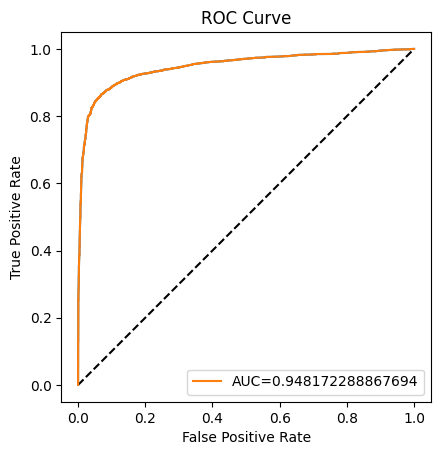

In [34]:
#ROC Curve
#Reference: https://www.statology.org/plot-roc-curve-python/

from sklearn.metrics import roc_curve
import sklearn.metrics as metrics

df_train_prob = model.predict(train_padded_seq)

fpr, tpr, thresholds = metrics.roc_curve(df_train_labels,df_train_prob)
auc = metrics.roc_auc_score(df_train_labels,df_train_prob)

# Plot the diagnal line
plt.plot([0, 1], [0, 1], 'k--')

# Plot the ROC curve with fpr on the x-axis and tpr on the y-axis.
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.axis('square')
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.legend(loc=4)
plt.show()


## Kaggle Submission

In [35]:
#Predictions on test data
df_test_pred = model.predict(df_test_padded_seq)
df_test_model['target'] = df_test_pred.round().astype(int)
df_test_model.drop(['keyword','location','text'],axis=1,inplace=True)

#Exporting File for Kaggle Submission
df_test_model.to_csv('budt737_Group17_Submission.csv', index=False)

102/102 [==============================] - 0s 2ms/step
